<a href="https://colab.research.google.com/github/Nazarique/meta-heur-sticas-bioinspiradas/blob/main/Projeto_metaheuristicas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Para executar todas as celulas basta ir em 

```
Ambiente de execução > executar tudo 
```
ou utilizar o atalho de teclas 


```
Ctrl + F9
```





In [ ]:
pip install control

     |████████████████████████████████| 256kB 3.5MB/s 
  Created wheel for control: filename=control-0.8.3-py2.py3-none-any.whl size=260982 sha256=306f483dba817a31b129681ab02638b68932185ec2a2c231e35c02b483d5da76
  Stored in directory: /root/.cache/pip/wheels/c2/d9/cc/90b28cb139a6320a3af2285428b6da87eee8d8920c78bb0223
Successfully built control


# Motor

Biliotecas que foram usadas, ou apenas usadas em teste

In [ ]:
# Discretização de FT continua, ZOH, 10-08
import pylab  
import control as ctrl
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import scipy.integrate as integrate
from control.grid import sgrid, zgrid

### Funções Auxiliares

Definição da função de plotagem, usando bilioteca plotly de gráficos interativos

In [ ]:
def gs(xs, ys, title="G(s)"):


  fig = go.Figure()
  
  fig.add_trace(go.Scatter(line=dict(color='red', width=2),
      visible=True, x=xs, y=ys,
      showlegend=True,
      name='G(s)',
      mode='lines'))

  fig.update_layout(width=700, height=400, showlegend=True,
      title=title,
      xaxis_title='time (s)',
      yaxis_title='Amplitude',
      xaxis_rangeslider_visible=False,
      #template="plotly_dark",
      margin=dict(r=10, t=25, b=40, l=60),
      annotations=[
          dict(
              text="Source: Nazário",
              showarrow=False,
              xref="paper",
              yref="paper",
              x=90,
              y=0)
      ])  
  return fig.show()

Definição da função de plotagem do step discreto

* A única diferença desta função para função anterior, é o tipo de interpolação que o gráfico faz.


```
shape='hv'
```



In [ ]:
def gz(xz, yz, ts_name, title="G(z)"):


  fig = go.Figure()
    
  fig.add_trace(go.Scatter(line=dict(shape='hv', color='blue', width=2),
      visible=True, x=xz, y=yz,
      showlegend=True,
      name="{0:s} {1:.3f}".format("G(z): ", ts_name),
      mode='lines'))

  fig.update_layout(width=700, height=400, showlegend=True,
      title=title,
      xaxis_title='time (s)',
      yaxis_title='Amplitude',
      xaxis_rangeslider_visible=False,
      #template="plotly_dark",
      margin=dict(r=10, t=25, b=40, l=60),
      annotations=[
          dict(
              text="Source: Nazário",
              showarrow=False,
              xref="paper",
              yref="paper",
              x=90,
              y=0)
      ])  
  return fig.show()

plot lugar das raízes/rloocus

* Como a biblioteca Control Python usa um grid e não apenas um raio unitário, está função realiza o plot do raio unitário com uma cor mais visível.




In [ ]:
from numpy import *

def plot_root(Gz, title, unit=False, fs=10e3):
  Ts = 1/fs
  
  roots, gain = ctrl.rlocus(Gz, PrintGain=True, xlim=[-4, 1.2], ylim=[-2.1, 2.1], grid =False)
  
  f = pylab.figure('Root Locus')
  
  ax = pylab.axes()
  if unit == False:
    # Constant damping lines
    zetas = linspace(0, 0.9, 10)

    for zeta in zetas:
        # Calculate in polar coordinates
        factor = zeta/sqrt(1-zeta**2)
        x = linspace(0, sqrt(1-zeta**2),2000)
        ang = pi*x
        mag = exp(-pi*factor*x)
        # Draw upper part in retangular coordinates
        xret = mag*cos(ang)
        yret = mag*sin(ang)
        ax.plot(xret,yret, 'k:', lw=1)
        # Draw lower part in retangular coordinates
        xret = mag*cos(-ang)
        yret = mag*sin(-ang)
        ax.plot(xret,yret,'k:', lw=1)
        # Annotation
        an_i = int(len(xret)/2.5)
        an_x = xret[an_i]
        an_y = yret[an_i]
        ax.annotate(str(round(zeta,2)), xy=(an_x, an_y), xytext=(an_x, an_y), size=7)

    # Constant natural frequency lines
    wns = linspace(0, 1, 10)

    for a in wns:
        # Calculate in polar coordinates
        x = linspace(-pi/2,pi/2,2000)
        ang = pi*a*sin(x)
        mag = exp(-pi*a*cos(x))
        # Draw in retangular coordinates
        xret = mag*cos(ang)
        yret = mag*sin(ang)
        ax.plot(xret,yret,'k:', lw=1)
        # Annotation
        an_i = -1
        an_x = xret[an_i]
        an_y = yret[an_i]
        num = '{:1.1f}'.format(a)
        ax.annotate(r"$\frac{"+num+r"\pi}{T}$", xy=(an_x, an_y), xytext=(an_x, an_y), size=9)
  else:
      f = pylab.figure('Root Locus')
      ax = pylab.axes()

      # henrique

      theta = np.linspace(0, 2*np.pi, 10000)

      r = np.sqrt(1.0)

      x1 = r*np.cos(theta)
      x2 = r*np.sin(theta)
      ax.plot(x1, x2, color='red',linestyle='dashed', linewidth=.9)
    
  ax.set_title("{0:s} {1:s} {2:.4f}".format(title, " Ts: ", Ts), fontsize=10)
  ax.set_xlim(-1.05, 1.05)
  ax.set_ylim(-1.05, 1.05)
  plt.show()



Definição da função para o truncamento dos valores das integrais do step
[Exemple: Trucar](https://stackoverflow.com/questions/8595973/truncate-to-three-decimals-in-python/8595991https://stackoverflow.com/questions/8595973/truncate-to-three-decimals-in-python/8595991
)

In [ ]:

def truncate(f_number, n_decimals):
      strFormNum = "{0:." + str(n_decimals+5) + "f}"
      trunc_num = float(strFormNum.format(f_number)[:-5])
      return(trunc_num)


# Projeto controle motor DC


Considere a planta dada por um motor de esteira rolante dado pela figura

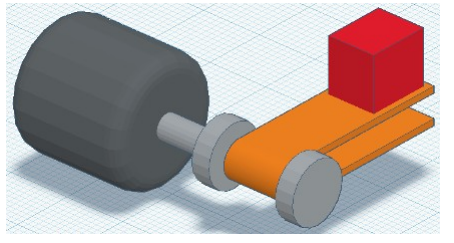

O modelo desse sistema pode ser visto como:

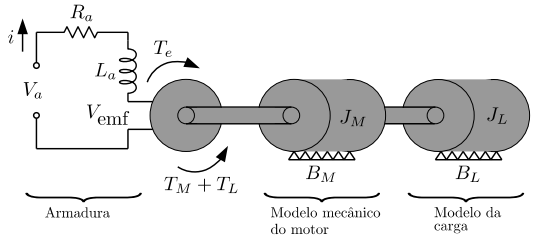

Com relação à parte elétrica do modelo, fazendo a análise de malha, temos:

$$ V_{a} -V_{Ra} -V_{La}  - V_{emf} =0$$

$$V_{a} -R_{a}i  - L_{a} \frac{di }{dt}  -K_{v}\omega=0$$

$$L_{a}\frac{di }{dt} = -R_{a}i  -K_{v}\omega+ V_{a}$$



Com relação à parte mecânica (motor + carga), fazendo a equivalência dos torques:

$$ T_{e} -T_{M}  - T_{L} =0$$




O torque equivalente causado pela carga segue o mesmo princípio do motor, com coeficientes de
inércia e de atrito

$$ T_{L} = J_{L}\frac{d\omega }{dt}  + B_{L}\omega $$

$$ T_{M} = J_{M}\frac{d\omega }{dt}  + B_{M}\omega $$

Substituindo na equação anterior:

$$ T_{e} - (J_{L}\frac{d\omega }{dt}  + B_{L}\omega)-( J_{M}\frac{d\omega }{dt}  + B_{M}\omega) $$


$$(J_{M}+J_{L})\frac{d\omega }{dt} = - (B_{M}+B_{L})\omega+k_{t}i$$

Agrupando os coeficientes na forma

$$J = J_{M}+J_{L} \\e\\ B=b_{M}+b_{L} $$

$$J\frac{d\omega }{dt} = - B\omega+k_{t}i$$

Considerando os estados  $x_{1}=i$ e $x_{2}=\omega$, a entrada $u=V_{a}$, chegamos à representação do
sistema em espaço de estados:

$$L_{a}\dot{x_{1}} =-R_{a}x_{1}-k_{v}x_{2}+u$$

$$J\dot{x_{2}} =k{t}x_{1}-Bx_{2}$$


Aplicando Laplace:

$$L_{a}sX_{1}(s) =-R_{a}X_{1}(s)-k_{v}X_{2}(s)+U(s)$$

$$JX_{2}(s) =k{t}X_{1}(s)-BX_{2}(s)$$

Isolando $X_{1}(s)$ na segunda equação e substituindo na primeira, isolando $X_{2}(s)$ chega-se à
função de transferência

$$\frac{X_{2}}{U(s)}=G_{1}(s)=\frac{1}{ \frac{L_{a}J}{k_t}s^2 +(\frac{L_{a}B}{k_t}+\frac{R_{a}J}{k_t})s+\frac{R_{a}B}{k_t}+k_{v}}$$


Isolando $X_{2}(s)$ na segunda equação e substituindo na primeira, isolando $X_{1}(s)$ chega-se à
função de transferência

$$\frac{X_{1}}{U(s)}=G_{2}(s)=\frac{Js+B}{ L_{a}Js^2 +(L_{a}B+R_{a}J)s+R_{a}B+{k_t}k_{v}}$$

Em um primeiro momento, usaremos os seguintes valores para os coeficientes:

$$L_{a} =0.35\, H,
R_{a} =1.5 \, \Omega,
V_{a} =220 \, V,
k_{t} =0.5,
k_{v} =13,
J_{M} =0.01,
B_{M} =0.1,
J_{L} =0.04,
B_{L} =0.3 $$



## Função de transferência Velocidade Angular em RPM, $G_{1}(s)$

In [ ]:
La =0.35
Ra =1.5
Va =220.
kt =0.5
kv =13.
Jm =0.01
Bm =0.1
Jl =0.04
BL =0.3
J =Jm+Jl
B =Bm+BL


num1 = 1.
den1 = [(La*J)/kt, ((La*B)/kt)+((Ra*J)/kt), (((Ra*B)/kt)+kv)]
Gs1 = ctrl.TransferFunction(num1, den1)
print("A partir da modelagem do sistema apresentada \nno roteiro obtém-se a função detransferência contínua dada por:\n\n")
Gs1

A partir da modelagem do sistema apresentada 
no roteiro obtém-se a função detransferência contínua dada por:





            1
-------------------------
0.035 s^2 + 0.43 s + 14.2

In [ ]:
xs1, ys1 = ctrl.step_response(Gs1)
gs(xs1, ys1, title="Velocidade Angular em RPM:")

In [ ]:
# discretização
fs = 10e3
Ts = 1/fs

Gz1 = ctrl.sample_system(Gs1, Ts, 'zoh')
print("E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz\n leva a seguinte função de transferência discreta:\n\n") 
Gz1

E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz
 leva a seguinte função de transferência discreta:





1.428e-07 z + 1.427e-07
-----------------------
z^2 - 1.999 z + 0.9988

dt = 0.0001

In [ ]:
xz1, yz1 = ctrl.step_response(Gz1, np.arange(0, xs1[-1], Ts))
gz(xz1, yz1, title="Velocidade Angular em RPM, Função Discretizada", ts_name=Ts)

### O gráfico Root Locus é mostrado na figura abaixo:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



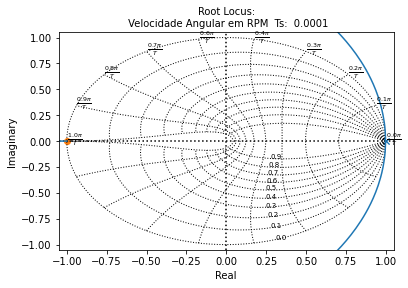

In [ ]:
plot_root(Gz1, 'Root Locus:\n Velocidade Angular em RPM')

Usando as mesmas funções, só que, sem o uso de um notebook "colab" ou "jupyter", podemos usar as funções dos gráficos da biblioteca Control Python, que utiliza função de eventos para representar os valores de ganho. 

Observando a figura percebe-se dois polos complexos conjugados próximos do círculo unitário, o motivo de ter tais polos, que a frequência de amostragem escolhida para o sistema foi inadequada. Ao dar zoom obtém-se:

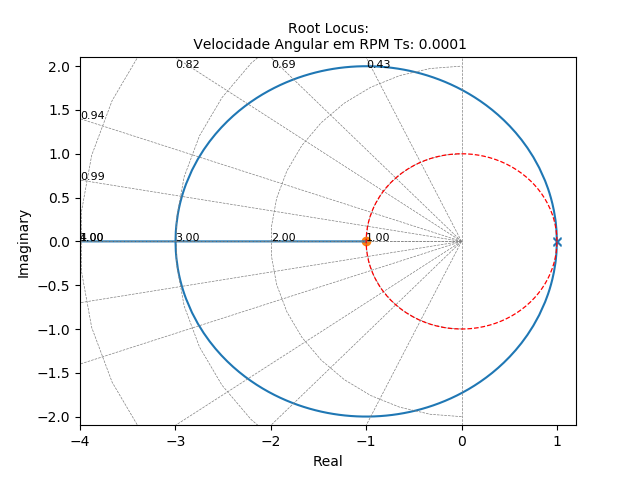

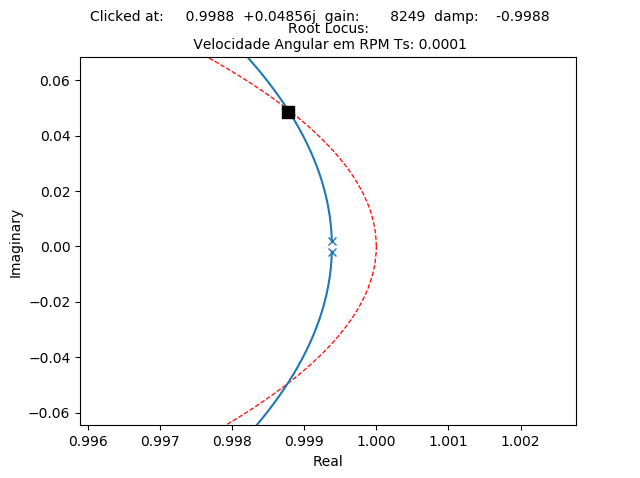

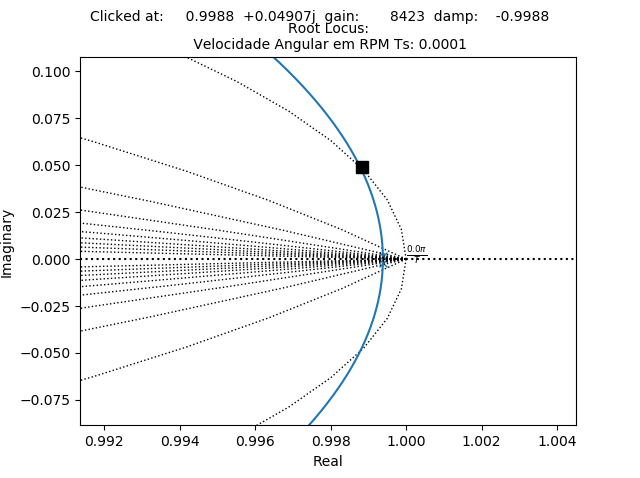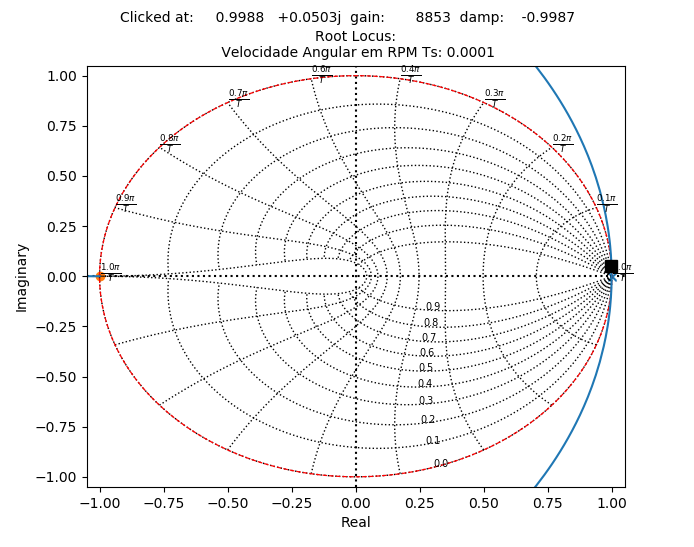

Apartir do gráfico também obtemos o ganho limite de estabilidade:

$$K_{max}=8249$$

In [ ]:
ctrl.step_info(Gs1, RiseTimeLimits=(0.,1.))

{'Overshoot': 36.44713033394348,
 'Peak': 0.09617270777617587,
 'PeakTime': 0.1642572805363503,
 'RiseTime': 0.09923877365737832,
 'SettlingMax': 0.09617270777617587,
 'SettlingMin': 0.06100607584702708,
 'SettlingTime': 0.5566496729287428,
 'SteadyStateValue': 0.07048349609171027,
 'Undershoot': 0.0}

### Controle PI

Polos da malha aberta

In [ ]:
Gz1.pole()

array([0.99938406+0.0019171j, 0.99938406-0.0019171j])

Requesitos de controle

s = 10 KHz.
- Tac < 8*t_subida
- Ov < 2%

In [ ]:
RiseTime = ctrl.step_info(Gs1, RiseTimeLimits=(0.,1.))['RiseTime']
Tac = RiseTime * 8
Tac

0.7939101892590266

O controlador PI projetado 

In [ ]:
c = 0.9991002
k1 = 12.1112

Kz = ctrl.sample_system(ctrl.TransferFunction([1],[1]),Ts,'zoh')
Kz.num = [[np.asarray([k1*1, -c*k1])]]
Kz.den = [[np.asarray([1,-1])]]
Kz


12.11 z - 12.1
--------------
    z - 1

dt = 0.0001

Controlador PI  $$C_{z} = \frac{12.1112z-12.100302342240001}{z-1}$$ 

Controlador $PI$ em serie com a planta $G_{z}$

In [ ]:
Cz = Gz1 * Kz
Cz


1.729e-06 z^2 + 8.48e-10 z - 1.727e-06
--------------------------------------
  z^3 - 2.999 z^2 + 2.998 z - 0.9988

dt = 0.0001

Fechando a malha

In [ ]:
Tz = ctrl.feedback(Cz)
xT, yT = ctrl.step_response(Tz, np.arange(0, 20, Ts))

Na resposta ao degrau é possível notar que o sistema projetado  atende aos requisitos solicitados

{'Overshoot': 0.8447877826638559,
 'Peak': 1.0084477054276704,
 'PeakTime': 0.36810000000000004,
 'RiseTime': 0.0772,
 'SettlingMax': 1.0084477054276704,
 'SettlingMin': 0.6272402961703847,
 'SettlingTime': 0.7798,
 'SteadyStateValue': 0.9999998290452368,
 'Undershoot': 0.0}

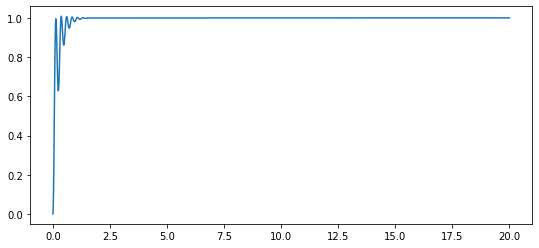

In [ ]:
fig, ax = plt.subplots(figsize=(9,4))
ax.step(xT, yT)
ax.plot(xT, yT, 'C0o',alpha=0.0)
ctrl.step_info(Tz, np.arange(0, 20, Ts))

Abaixo temos o mesmo plot de resposta ao degrau, mas usando um gráfico interativo, assim é possivel aproximar imagem para verificar sua oscilação

In [ ]:
gz(xT, yT, title="Velocidade Angular em RPM, Malha fechada PI", ts_name=Ts)

Os valores de $K_{p} \,e\, K_{i}$, podem ser calculados apartir da seguinte comparação:

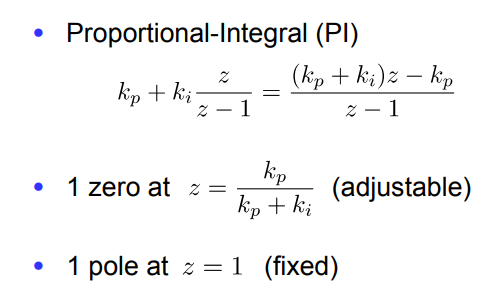

In [ ]:
#  kp e ki
kp = c*k1
ki = k1-kp
print("\tKp: "+str(kp)+"\n\tKi: "+str(ki))


	Kp: 12.100302342240001
	Ki: 0.01089765775999929


**Equação a diferenças do controle**


$$C_{z} = \frac{12.1112z-12.100302342240001}{z-1}$$

$$\frac{U_{z}}{E_{z}} = \frac{Az-B}{z-1}$$

$$U_{z}[z-1] = E_{z}[Az-B]$$

$$U_{z}[1-z^{-1}] = E_{z}[A-Bz^{-1}]$$

$$u_{k} -u_{k-1} = A e_{k} -Be_{k-1}$$

$$u_{k}  = A e_{k} -Be_{k-1} + u_{k-1}$$




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



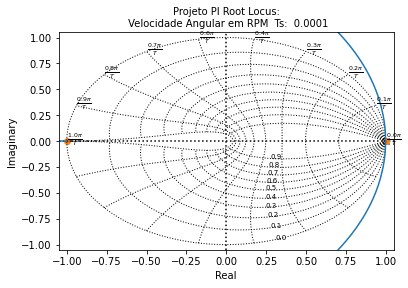

In [ ]:
plot_root(Tz, 'Projeto PI Root Locus:\n Velocidade Angular em RPM')

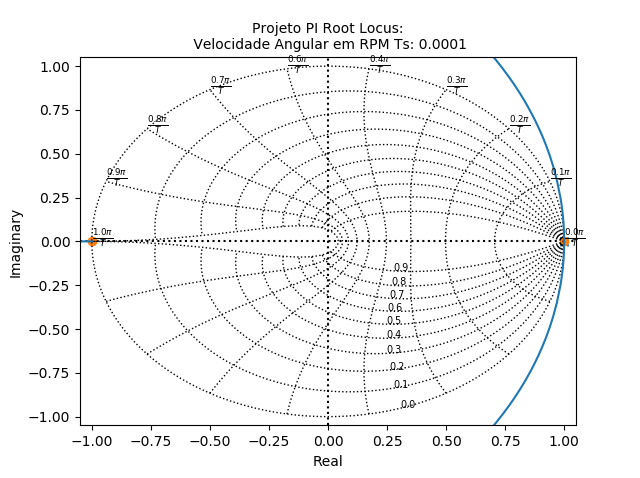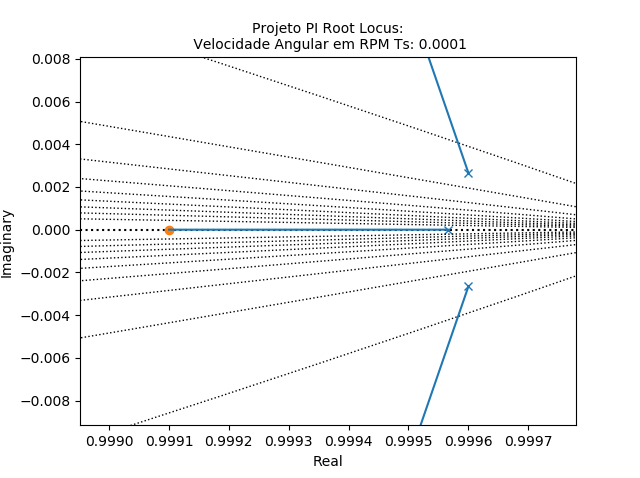

Para facilitar a visualização foi feito o mesmo plot, mas sem a utilização do grid z

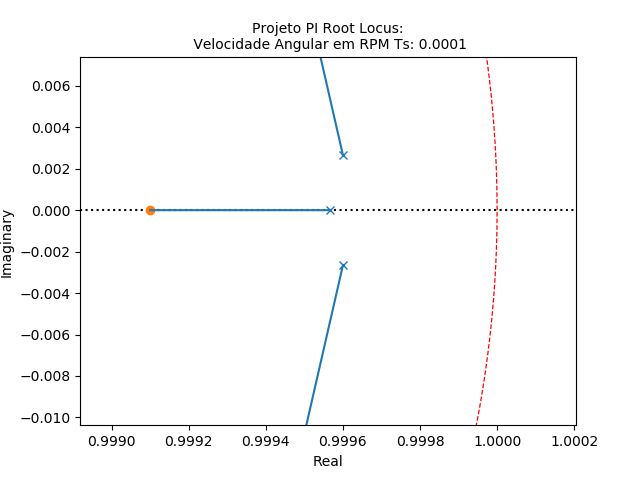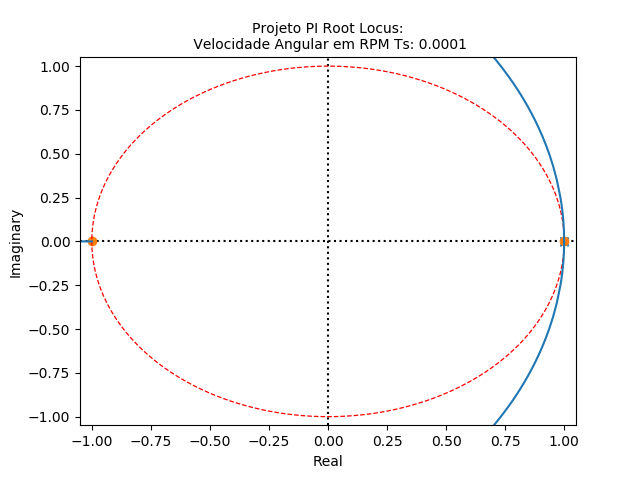

## Função de transferência da Corrente de armadura, $G_{2}(s)$

In [ ]:
num2 = [J, B]
den2 = [La*J, (La*B)+(Ra*J), (Ra*B)+(kv*kt)]
Gs2 = ctrl.TransferFunction(num2, den2)
print("A partir da modelagem do sistema apresentada \nno roteiro obtém-se a função detransferência contínua dada por:\n\n")

Gs2

A partir da modelagem do sistema apresentada 
no roteiro obtém-se a função detransferência contínua dada por:





       0.05 s + 0.4
--------------------------
0.0175 s^2 + 0.215 s + 7.1

In [ ]:
xs2, ys2 = ctrl.step_response(Gs2)
gs(xs2, ys2, title="Corrente de armadura")

In [ ]:
Gz2 = ctrl.sample_system(Gs2, Ts, 'zoh')
print("E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz\n leva a seguinte função de transferência discreta:\n\n") 
Gz2

E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz
 leva a seguinte função de transferência discreta:





0.0002857 z - 0.0002854
-----------------------
z^2 - 1.999 z + 0.9988

dt = 0.0001

In [ ]:
xz2, yz2 = ctrl.step_response(Gz2, np.arange(0, xs2[-1], Ts))
gz(xz2, yz2, title="Corrente de Armadura, Função Discretizada", ts_name=Ts)

### O gráfico Root Locus é mostrado na figura abaixo:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



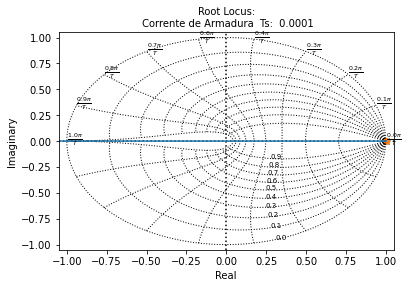

In [ ]:
plot_root(Gz2, 'Root Locus:\n Corrente de Armadura')

Usando as mesmas funções, só que, sem o uso de um notebook "colab" ou "jupyter", podemos usar as funções dos gráficos da biblioteca Control Python, que utiliza função de eventos para representar os valores de ganho. 

Observando a figura percebe-se dois polos complexos conjugados próximos do círculo unitário, o motivo de ter tais polos, que a frequência de amostragem escolhida para o sistema foi inadequada. Ao dar zoom obtém-se:

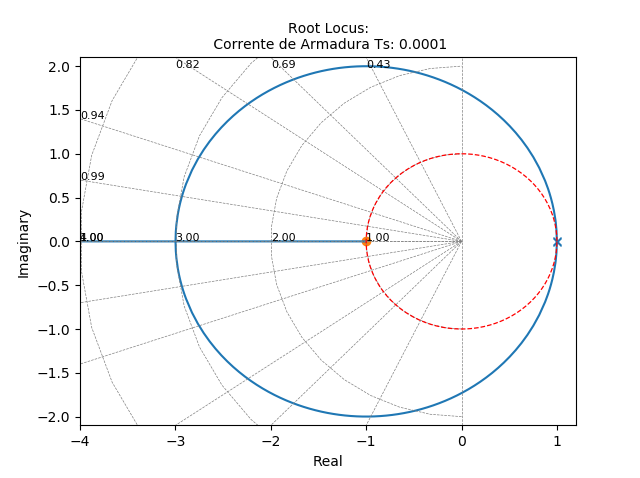



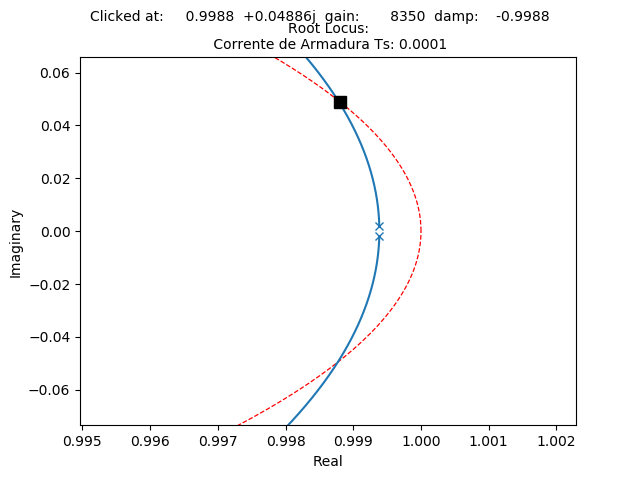

Apartir do gráfico também obtemos o ganho limite de estabilidade:

$$K_{max}=8350$$

In [ ]:
ctrl.step_info(Gs2, RiseTimeLimits=(0.,1.))

{'Overshoot': 140.95769743324405,
 'Peak': 0.13591129899352858,
 'PeakTime': 0.086691342505296,
 'RiseTime': 0.021672835626324,
 'SettlingMax': 0.13591129899352858,
 'SettlingMin': 0.02724057508683181,
 'SettlingTime': 0.7733780291919827,
 'SteadyStateValue': 0.05640463053942571,
 'Undershoot': 0.0}

## Análise do período de amostragem

Verificou-se que a frequência de amostragem $f= 10\,kHz$ é muito alta.

Uma maneira de se verificar o período de amostragem ideial, é utilizar o cálculo da integral, onde observamos apartir de qual periodo se tem uma perda na precisão da integral

In [ ]:
sys = Gs1

xs, ys = ctrl.step_response(sys)
trunc = 4
entreguei = 0
for i in range(1, len(xs), 1):
  values = integrate.trapz([ys[i-1], ys[i]],
                            [xs[i-1], xs[i]])
  
  entreguei += values

entreguei = entreguei
  
print('\n\n\tStep da função de transferência'
              + '\n\tValor da integral: ' + str(entreguei))
print(70*'-'+'\n')
gs(xs, ys, title="Step da função de transferência contínua:")



	Step da função de transferência
	Valor da integral: 0.07811412990929621
----------------------------------------------------------------------



Inspeção do erro causado pela limitação de representação numérica do dispositivo de controle digital

In [ ]:
sys = Gs1
for t in range(0, 20, 2):
    
  if t == 0:
    ts_zinho = 1/100
  else:
    ts_zinho = t/100

  entreguei = 0
  syz = ctrl.sample_system(sys, ts_zinho, method='zoh')
  
  xz,yz = ctrl.step_response(syz, np.arange(0, xs[-1], ts_zinho))

  for i in range(1, len(xz), 1):
    values = integrate.trapz([truncate( yz[i-1], trunc), truncate( yz[i], trunc)],
                             [truncate( xz[i-1], trunc), truncate( xz[i], trunc)])
    
    entreguei += truncate(values, trunc)

  entreguei = truncate(entreguei, trunc)
    
  print('\n\n\tStep da função de transferência discretizada (Ts =' + str(ts_zinho) + ')'
                + '\n\tValor da integral: ' + str(entreguei))
  print(70*'-'+'\n')
  
  gz(xz, yz, ts_zinho)



	Step da função de transferência discretizada (Ts =0.01)
	Valor da integral: 0.0737
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.02)
	Valor da integral: 0.0745
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.04)
	Valor da integral: 0.0755
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.06)
	Valor da integral: 0.0729
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.08)
	Valor da integral: 0.0762
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.1)
	Valor da integral: 0.0746
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.12)
	Valor da integral: 0.0733
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.14)
	Valor da integral: 0.076
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.16)
	Valor da integral: 0.0758
----------------------------------------------------------------------





	Step da função de transferência discretizada (Ts =0.18)
	Valor da integral: 0.0727
----------------------------------------------------------------------



Inspeção da localização dos polos e zeros no LR discreto. Faixa razoável, parte real entre 0.5 e 0.95).

Com o fim de encontrar sub-amostragem é feito uma comparação de valores dentro de $0.01\,ms$ até $0.045\,ms$

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



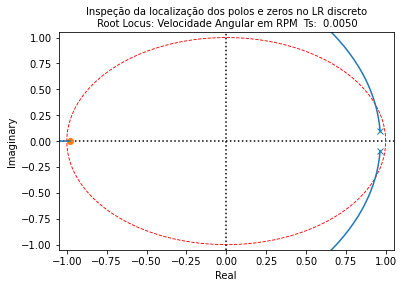

Ts: 0.005
Pólos: [0.96529541+0.09287028j 0.96529541-0.09287028j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



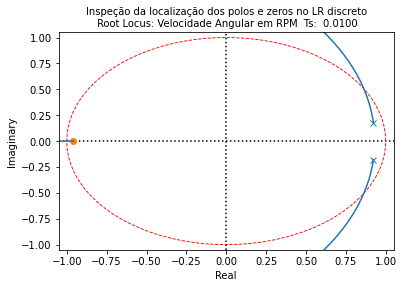

Ts: 0.01
Pólos: [0.92317034+0.1792945j 0.92317034-0.1792945j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



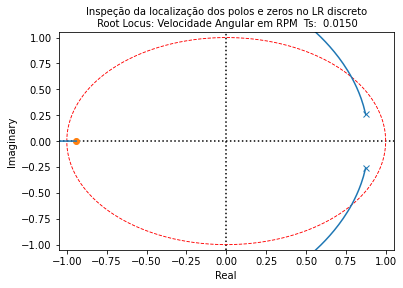

Ts: 0.015
Pólos: [0.87448096+0.25880725j 0.87448096-0.25880725j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



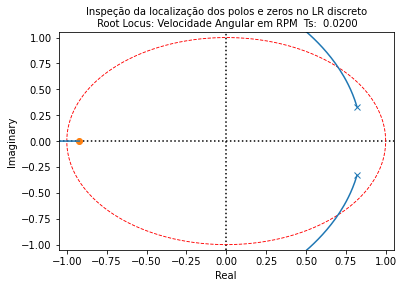

Ts: 0.02
Pólos: [0.82009696+0.33103874j 0.82009696-0.33103874j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



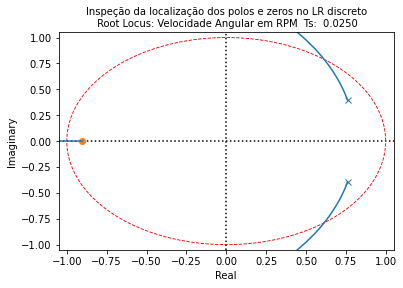

Ts: 0.025
Pólos: [0.76089217+0.3957128j 0.76089217-0.3957128j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



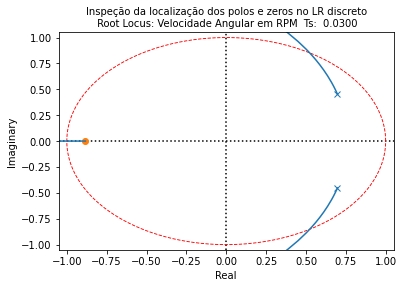

Ts: 0.03
Pólos: [0.69773576+0.45264402j 0.69773576-0.45264402j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



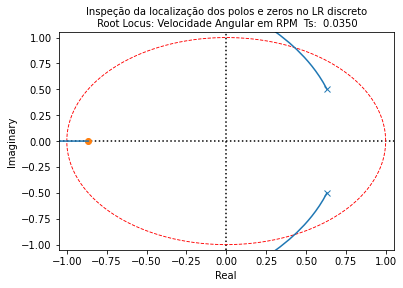

Ts: 0.035
Pólos: [0.63148395+0.50173411j 0.63148395-0.50173411j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



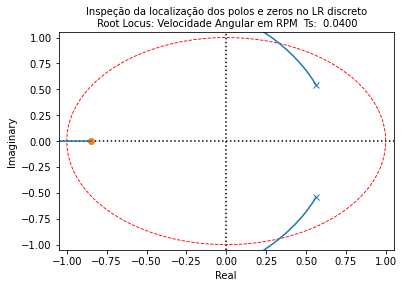

Ts: 0.04
Pólos: [0.56297237+0.54296772j 0.56297237-0.54296772j]
----------------------------------------------------------------------


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



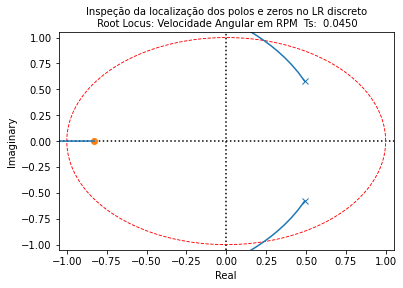

Ts: 0.045
Pólos: [0.49300909+0.57640765j 0.49300909-0.57640765j]
----------------------------------------------------------------------


In [ ]:
Ts_list = list()

for t in range(1, 10, 1):
  
  ts_zinho = t/(2*100)

  Ts_list.append(ts_zinho)
  syz = ctrl.sample_system(sys, ts_zinho, method='zoh')

  
  poles, zeros = ctrl.pzmap(syz, Plot=False)
  plot_root(syz, 'Inspeção da localização dos polos e zeros no LR discreto\n Root Locus: Velocidade Angular em RPM',unit=True, fs=1/ts_zinho)
  print('Ts: '+str(ts_zinho)+'\nPólos: '+str(poles))
  print(70*'-')

  plt.show()	

De acordo com o parâmetro da parte real do polo, estar localizada entre $0.5$ e $0.95$, é possivel verificar que a feixa de periodo de amostragem que atende, se enquadra dentro de $0.01\,ms$ até $0.04\,ms$

## Mudança da frequência de discretização *Fs* = 65 Hz

In [ ]:
La =0.35
Ra =1.5
Va =220.
kt =0.5
kv =13.
Jm =0.01
Bm =0.1
Jl =0.04
BL =0.3
J =Jm+Jl
B =Bm+BL


num3 = 1.
den3 = [(La*J)/kt, ((La*B)/kt)+((Ra*J)/kt), (((Ra*B)/kt)+kv)]
Gs3 = ctrl.TransferFunction(num1, den1)
print("A partir da modelagem do sistema apresentada \nno roteiro obtém-se a função detransferência contínua dada por:\n\n")
Gs3

A partir da modelagem do sistema apresentada 
no roteiro obtém-se a função detransferência contínua dada por:





            1
-------------------------
0.035 s^2 + 0.43 s + 14.2

In [ ]:
xs3, ys3 = ctrl.step_response(Gs3)
gs(xs3, ys3, title="Velocidade Angular em RPM:")

In [ ]:
# discretização
fs = 65
Ts3 = 1/fs

Gz3 = ctrl.sample_system(Gs3, Ts3, 'zoh')
print("E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz\n leva a seguinte função de transferência discreta:\n\n") 
Gz3

E a discretização dessa planta feita com o método ZOH utilizando uma frequência de amostragem fS=10kHz
 leva a seguinte função de transferência discreta:





 0.003153 z + 0.00296
----------------------
z^2 - 1.741 z + 0.8278

dt = 0.015384615384615385

In [ ]:
xz3, yz3 = ctrl.step_response(Gz3, np.arange(0, xs3[-1], Ts3))
gz(xz1, yz1, title="Velocidade Angular em RPM, Função Discretizada", ts_name=Ts3)

## Controle PI

In [ ]:
ctrl.step_info(Gs3, RiseTimeLimits=(0.,1.))

{'Overshoot': 36.44713033394348,
 'Peak': 0.09617270777617587,
 'PeakTime': 0.1642572805363503,
 'RiseTime': 0.09923877365737832,
 'SettlingMax': 0.09617270777617587,
 'SettlingMin': 0.06100607584702708,
 'SettlingTime': 0.5566496729287428,
 'SteadyStateValue': 0.07048349609171027,
 'Undershoot': 0.0}

Polos da malha aberta

In [ ]:
Gz3.pole()

array([0.87048862+0.26462611j, 0.87048862-0.26462611j])

Requesitos de controle

s = 65 Hz.
- Tac < 8*t_subida
- Ov < 2%

In [ ]:
RiseTime = ctrl.step_info(Gs3, RiseTimeLimits=(0.,1.))['RiseTime']
Tac = RiseTime * 8
Tac

0.7939101892590266

O controlador PI projetado 

In [ ]:
c = 0.48
k3 = 2.15

Kz3 = ctrl.sample_system(ctrl.TransferFunction([1],[1]),Ts3,'zoh')
Kz3.num = [[np.asarray([k3*1, -c*k3])]]
Kz3.den = [[np.asarray([1,-1])]]
Kz3


2.15 z - 1.032
--------------
    z - 1

dt = 0.015384615384615385

Controlador PI  $$C_{z} = \frac{2.15z-1.032}{z-1}$$ 

Controlador $PI$ em serie com a planta $G_{z}$

In [ ]:
Cz3 = Gz3 * Kz3
Cz3


0.006779 z^2 + 0.00311 z - 0.003055
-----------------------------------
z^3 - 2.741 z^2 + 2.569 z - 0.8278

dt = 0.015384615384615385

Fechando a malha

In [ ]:
Tz3 = ctrl.feedback(Cz3)
#ctrl.sisotool(Cz)
xT3, yT3 = ctrl.step_response(Tz3, np.arange(0, 20, Ts3))

Na resposta ao degrau é possível notar que o sistema projetado  atende aos requisitos solicitados

{'Overshoot': 0.38234870569910795,
 'Peak': 1.0038234870569946,
 'PeakTime': 0.8615384615384616,
 'RiseTime': 0.4,
 'SettlingMax': 1.0038234870569946,
 'SettlingMin': 0.9183768444556842,
 'SettlingTime': 0.7846153846153847,
 'SteadyStateValue': 1.0000000000000036,
 'Undershoot': 0.0}

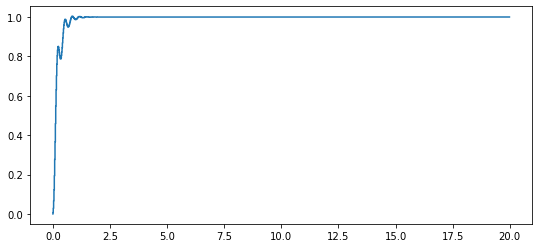

In [ ]:
fig, ax = plt.subplots(figsize=(9,4))
ax.step(xT3, yT3)
ax.plot(xT3, yT3, 'C0o',alpha=0.0)
ctrl.step_info(Tz3, np.arange(0, 20, Ts3))

Abaixo temos o mesmo plot de resposta ao degrau, mas usando um gráfico interativo, assim é possivel aproximar imagem para verificar sua oscilação

In [ ]:
gz(xT3, 10*yT3, title="Velocidade Angular em RPM, Malha fechada PI", ts_name=Ts3)

Os valores de $K_{p} \,e\, K_{i}$, podem ser calculados apartir da seguinte comparação:

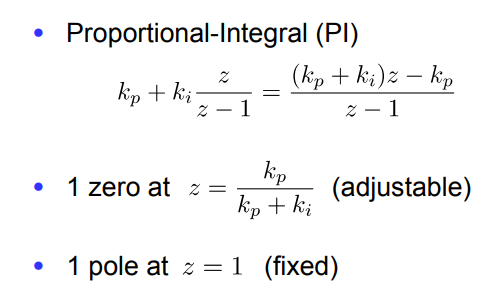

In [ ]:
#  kp e ki
kp = c*k3
ki = k3-kp
print("\tKp: "+str(kp)+"\n\tKi: "+str(ki))

	Kp: 1.032
	Ki: 1.1179999999999999


**Equação a diferenças do controle**


$$C_{z} = \frac{2.15z-1.032}{z-1}$$

$$\frac{U_{z}}{E_{z}} = \frac{Az-B}{z-1}$$

$$U_{z}[z-1] = E_{z}[Az-B]$$

$$U_{z}[1-z^{-1}] = E_{z}[A-Bz^{-1}]$$

$$u_{k} -u_{k-1} = A e_{k} -Be_{k-1}$$

$$u_{k}  = A e_{k} -Be_{k-1} + u_{k-1}$$




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



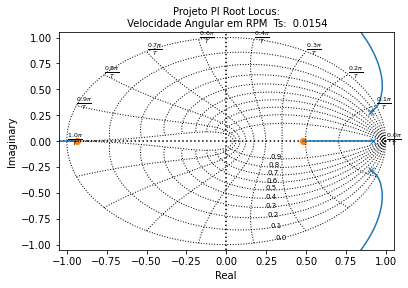

In [ ]:
plot_root(Tz3, 'Projeto PI Root Locus:\n Velocidade Angular em RPM', fs = 65)

Para facilitar a visualização foi feito o mesmo plot, mas sem a utilização do grid z

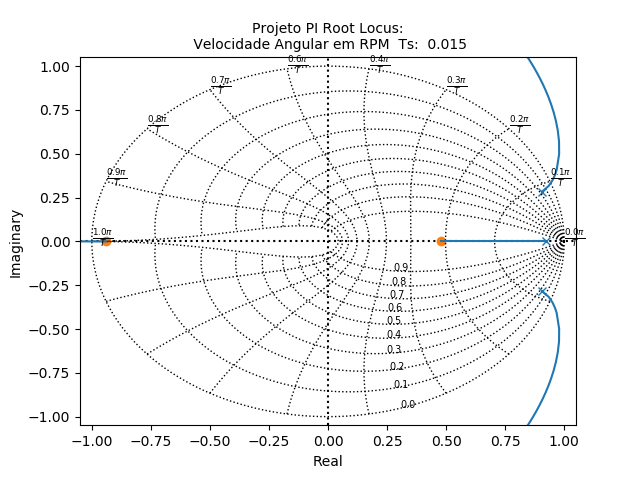

Para facilitar a visualização foi feito o mesmo plot, mas sem a utilização do grid z

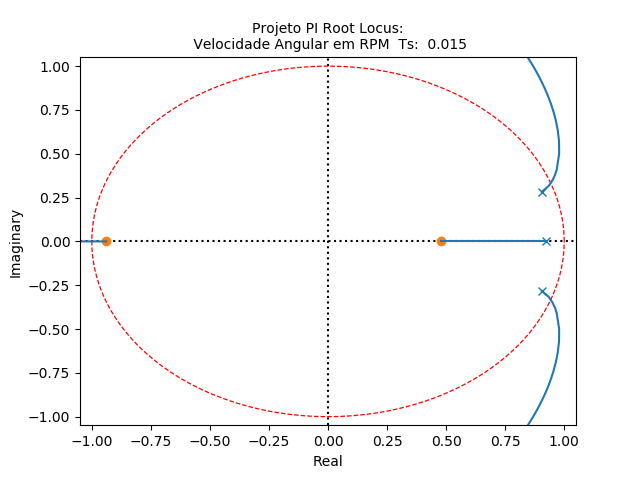

## Controle PID

Polos da malha aberta

In [ ]:
ctrl.step_info(Gs3, RiseTimeLimits=(0.,1.))

{'Overshoot': 36.44713033394348,
 'Peak': 0.09617270777617587,
 'PeakTime': 0.1642572805363503,
 'RiseTime': 0.09923877365737832,
 'SettlingMax': 0.09617270777617587,
 'SettlingMin': 0.06100607584702708,
 'SettlingTime': 0.5566496729287428,
 'SteadyStateValue': 0.07048349609171027,
 'Undershoot': 0.0}

In [ ]:
Gz3.pole()

array([0.87048862+0.26462611j, 0.87048862-0.26462611j])

Requesitos de controle

s = 65 Hz.
- Tac < 4 * t_subida
- Ov < 2%

In [ ]:
RiseTime = ctrl.step_info(Gs1, RiseTimeLimits=(0.,1.))['RiseTime']
Tac = RiseTime * 4
Tac

0.3969550946295133

O controlador PID projetado 

In [ ]:

r =  0.8704
theta = 0.2646
k4 = 25
B=2*r
C= ((4*theta*theta)+(B*B))/4

Kz4 = ctrl.sample_system(ctrl.TransferFunction([1], [1]), Ts3, 'zoh')
knum4 = np.asarray([k4, -1*B*k4, C*k4])
kden4 = np.asarray([1, -1, 0])
Kz4.num = [[knum4]]
Kz4.den = [[kden4]]
Kz4


25 z^2 - 43.52 z + 20.69
------------------------
        z^2 - z

dt = 0.015384615384615385

Controlador PID  $$C_{z} = \frac{25z^2 −43.52z+20.69}{z-1}$$

Controlador $PID$ em serie com a planta $G_{z}$

In [ ]:
Cz4 = Gz3 * Kz4
Cz4


0.07882 z^3 - 0.06322 z^2 - 0.06358 z + 0.06124
-----------------------------------------------
    z^4 - 2.741 z^3 + 2.569 z^2 - 0.8278 z

dt = 0.015384615384615385

Fechando a malha

In [ ]:
Tz4 = ctrl.feedback(Cz4)
#ctrl.sisotool(Cz)
xT4, yT4= ctrl.step_response(Tz4, np.arange(0,xs3[-1], Ts3))

Na resposta ao degrau é possível notar que o sistema projetado  atende aos requisitos solicitados

ValueError: ignored

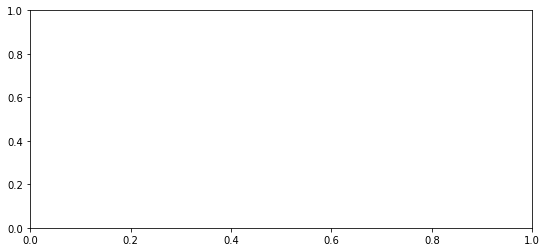

In [ ]:
fig, ax = plt.subplots(figsize=(9,4))
ax.step(xT4, yT4)
ax.plot(xT4, yT4, 'C0o',alpha=0.0)
ctrl.step_info(Tz4, np.arange(0,1, Ts3))

Abaixo temos o mesmo plot de resposta ao degrau, mas usando um gráfico interativo, assim é possivel aproximar imagem para verificar sua oscilação

In [ ]:
gz(xT4, yT4, title="Velocidade Angular em RPM, Malha fechada PID", ts_name=Ts3)

Os valores de $K_{p} \, K_{i}\,e \, K_{d}$, podem ser calculados apartir da seguinte comparação:

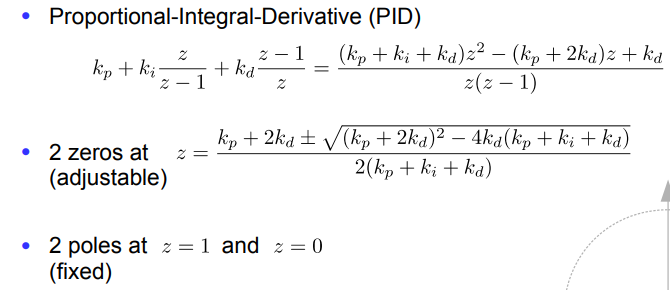

In [ ]:
import sympy as sym
from sympy import init_printing

z = sym.symbols('z')
init_printing() 

obtendo os valores de $K_{p} \, K_{i}\,e \, K_{d}$

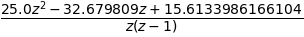

In [ ]:
#  kp, ki e kd
kd = C * k4
kp = (2*r*k4) -(2*C*k4)
ki = k4 -kp - kd 

PID = ((kp+ki+kd)*z**2 - (kp+2*kd)*z + kd)/(z*(z-1))
PID

Prova real do controlador

In [ ]:
Kz4


25 z^2 - 32.68 z + 15.61
------------------------
        z^2 - z

dt = 0.015384615384615385

In [ ]:
print("\t{0:s}{1:.3f}\n\t{2:s}{3:.3f}\n\t{4:s}{5:.3f}".format("Kp: ", kp,"Ki: ",ki,"Kd: ",kd))

	Kp: 1.453
	Ki: 7.934
	Kd: 15.613




> Bloco com recuo
np.asarray([k, -1*B*k, C*k])


**Equação a diferenças do controle**


$$C_{z} = \frac{25z^2 −43.52z+20.69}{z-1}$$

$$\frac{U_{z}}{E_{z}} = \frac{Kz^2-BK+CK}{z-1}$$

$$U_{z}[z-1] = E_{z}[Kz^2-BK+CK]$$

$$U_{z}[1-z^{-1}] = E_{z}[K-BKz^{-1}+CKz^{-2}]$$

$$u_{k} -u_{k-1} = K e_{k}-BK e_{k-1} -CKe_{k-2}$$

$$u_{k}  = K e_{k}-BK e_{k-1} -CKe_{k-2}+ u_{k-1}$$




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



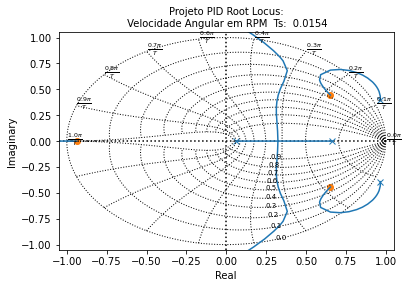

In [ ]:
plot_root(Tz4, 'Projeto PID Root Locus:\n Velocidade Angular em RPM', fs=65)

Para facilitar a visualização foi feito o mesmo plot, mas sem a utilização do grid z

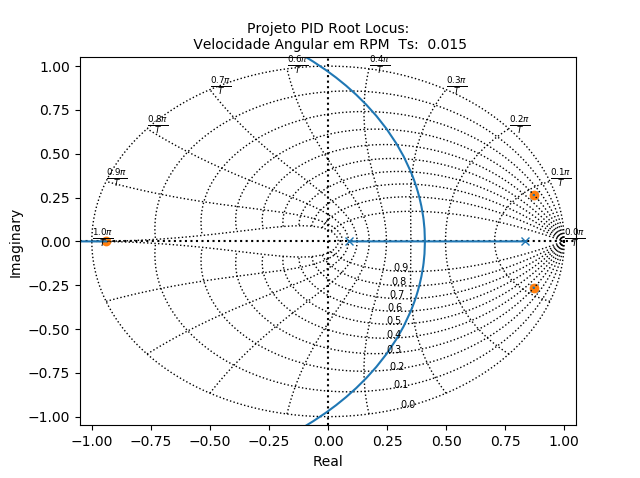

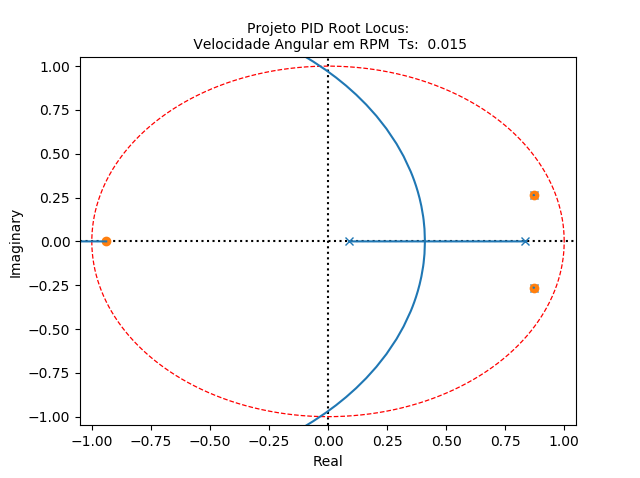

## Conclusão

# Nova seção

In [ ]:
pip install sko

In [ ]:
RiseTime = ctrl.step_info(Gs1, RiseTimeLimits=(0.,1.))['RiseTime']
Tac = RiseTime * 4
Tac

In [ ]:
def step_info_f(sys, T, SettlingTimeThreshold=0.02,
              RiseTimeLimits=(0.1, 0.9)):
  
    T, yout = ctrl.step_response(sys, T)
    # Steady state value
    InfValue = yout[-1]

    # RiseTime
    tr_lower_index = (np.where(yout >= RiseTimeLimits[0] * InfValue)[0])[0]
    tr_upper_index = (np.where(yout >= RiseTimeLimits[1] * InfValue)[0])[0]
    RiseTime = T[tr_upper_index] - T[tr_lower_index]

    # SettlingTime
    sup_margin = (1. + SettlingTimeThreshold) * InfValue
    inf_margin = (1. - SettlingTimeThreshold) * InfValue
    # find Steady State looking for the first point out of specified limits
    for i in reversed(range(T.size)):
        if((yout[i] <= inf_margin) | (yout[i] >= sup_margin)):
            SettlingTime = T[i]
            break

    # Peak
    PeakIndex = np.abs(yout).argmax()
    PeakValue = yout[PeakIndex]
    PeakTime = T[PeakIndex]
    SettlingMax = (yout).max()
    SettlingMin = (yout[tr_upper_index:]).min()
    # I'm really not very confident about UnderShoot:
    UnderShoot = yout.min()
    OverShoot = 100. * (yout.max() - InfValue) / (InfValue - yout[0])

    # Return as a dictionary
    S = {
        'RiseTime': RiseTime,
        'SettlingTime': SettlingTime,
        'SettlingMin': SettlingMin,
        'SettlingMax': SettlingMax,
        'Overshoot': OverShoot,
        'Undershoot': UnderShoot,
        'Peak': PeakValue,
        'PeakTime': PeakTime,
        'SteadyStateValue': InfValue
    }

    return S

In [ ]:
def func(x, k4 = 25):
  #r = 0.8704
  r, theta = x[0], x[1]
  #theta = 0.2646
  B=2*r
  C= ((4*theta*theta)+(B*B))/4

  Kz4 = ctrl.sample_system(ctrl.TransferFunction([1], [1]), Ts3, 'zoh')
  knum4 = np.asarray([k4, -1*B*k4, C*k4])
  kden4 = np.asarray([1, -1, 0])
  Kz4.num = [[knum4]]
  Kz4.den = [[kden4]]

  Cz4 = Gz3 * Kz4

  Tz4 = ctrl.feedback(Cz4)
  info = step_info_f(Tz4, np.arange(0, 20, Ts3))

  if info['Overshoot'] < 0:
    return 100

  saida = info['SettlingTime'] * 10 + info['Overshoot'] 

  return saida

In [ ]:
from sko.AFSA import AFSA

modelos = []
result = []
for _ in range(10): 
  afsa = AFSA(func, n_dim=2, size_pop=50, max_iter=100,
              max_try_num=20, step=0.0005, visual=0.3,
              q=0.98, delta=0.05)

  [best_x, best_y] = afsa.run()
  result.append([best_x, best_y]); result.append(afsa)


print(result)

[[array([0.79519614, 0.03973684]), 10.153846153851127], <sko.AFSA.AFSA object at 0x7f5fd6146a58>, [array([0.63745278, 0.55601533]), 4.051545665835748], <sko.AFSA.AFSA object at 0x7f5fd6146908>, [array([0.6473914 , 0.06556724]), 3.693679790748603], <sko.AFSA.AFSA object at 0x7f5fd6146518>, [array([0.76552666, 0.36581234]), 4.000196401030994], <sko.AFSA.AFSA object at 0x7f5fd6146630>, [array([ 0.53342762, -0.0133421 ]), 5.692307692308402], <sko.AFSA.AFSA object at 0x7f5fd6146668>, [array([0.86712177, 0.04995821]), 3.7626679572241577], <sko.AFSA.AFSA object at 0x7f5fd61466a0>, [array([0.91271086, 0.29067643]), 40.77024228752789], <sko.AFSA.AFSA object at 0x7f5fd6146c88>, [array([ 0.9365143 , -0.04662443]), 8.153846153847397], <sko.AFSA.AFSA object at 0x7f5fd61467f0>, [array([0.97908631, 0.37822789]), 5.384615384615918], <sko.AFSA.AFSA object at 0x7f5fd61465f8>, [array([0.56975436, 0.30289346]), 5.538487937720362], <sko.AFSA.AFSA object at 0x7f5fd61465c0>]


In [ ]:
modelos = []
for i in range(0,20,2):
  modelos.append(result[i+1])

In [ ]:
box = []
for i in range(0,10,1):
  box.append(modelos[i].Y)

In [ ]:
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly import subplots
import numpy as np
from scipy.spatial import Delaunay

In [ ]:
def Box_plot(dados, titulo='title'):
  
  x_data = ['1','2','3','4', '5','6','7','8','9','10']



  y_data = dados

  colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)',
            'rgba(200, 56, 45, 0.5)', 'rgba(200, 65, 54, 0.5)', 'rgba(100, 65, 54, 0.5)',
            'rgba(50, 14, 21, 0.5)', 'rgba(205, 104, 14, 0.5)', 'rgba(54, 140, 101, 0.5)',
            'rgba(3, 64, 24, 0.5)']

  fig = go.Figure()

  for xd, yd, cls in zip(x_data, y_data, colors):
          fig.add_trace(go.Box(showlegend=True,
                              y=yd,
                              name=xd))

  fig.update_layout(width=700, height=400,
      yaxis_title='Objetivo',
      xaxis_title='Rodadas',
      title=titulo,
      template="simple_white",
      yaxis=dict(showgrid=True,), 
      xaxis=dict(showgrid=True,),
      margin=dict(l=30, r=30, b=50, t=50,),
      paper_bgcolor='rgb(223, 223, 223)',
      plot_bgcolor='rgb(223, 223, 223)',
      showlegend=True,
      annotations=[dict(text="Source: Furquim e Nazário",
                        showarrow=False,
                        xref="paper",
                        yref="paper",
                        x=1,
                        y=-0.15)])
  fig.show()


In [ ]:
Box_plot(box, titulo='Objetivo de população')

Os requisitos de projetos foram atendidos, as analises para uma frequência de discretização mostram a importancia da mesma, onde em uma pequena variação da frequência o sistema acaba sendo muito diferente da função de transferência original.



Em relação ao controle, podemos observar que um controlador do tipo PID acaba sendo mais rapido que um sistema usando um controle do tipo PI, o uso de ferramentas computacionais para simular o controle discreto são indispensáveis. 